<a href="https://colab.research.google.com/github/qorganbek/ComputerVision-Spring-2024/blob/main/lab_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
# With pip:
!pip install facenet-pytorch

# or clone this repo, removing the '-' to allow python imports:
!git clone https://github.com/timesler/facenet-pytorch.git facenet_pytorch


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 8.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [10]:
#library https://github.com/timesler/facenet-pytorch

In [11]:
from facenet_pytorch import MTCNN, InceptionResnetV1
from PIL import Image


In [12]:
import numpy as np
import torch

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [14]:
# If required, create a face detection pipeline using MTCNN:
mtcnn = MTCNN(image_size=228, device='cuda')

# Create an inception resnet (in eval mode):
resnet = InceptionResnetV1(pretrained='vggface2').eval()

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [15]:
img = Image.open('/content/drive/MyDrive/dataset_realmadrid/andriy_lunin/8.jpg')

# Get cropped and prewhitened image tensor
img_cropped = mtcnn(img)

# Calculate embedding (unsqueeze to add batch dimension)
img_embedding = resnet(img_cropped.unsqueeze(0))


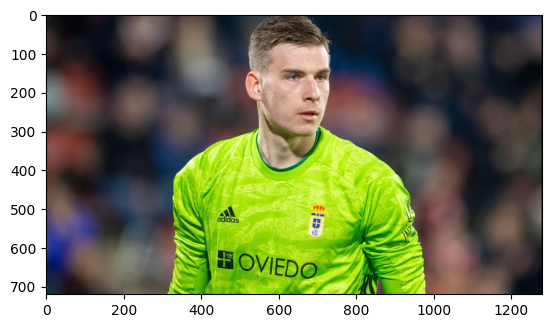

In [16]:
import matplotlib.pyplot as plt
plt.imshow(img)

In [17]:
img_embedding

tensor([[-4.2611e-02,  3.3853e-02,  4.1423e-02,  3.5274e-02, -2.6835e-02,
          4.3618e-02, -7.8597e-02, -6.3368e-02,  6.0115e-04,  2.8733e-02,
          1.7770e-02,  3.9376e-02, -6.5608e-02,  4.4562e-02,  6.8778e-03,
          2.4965e-02,  8.7113e-02,  5.6617e-02,  3.5607e-02,  2.0574e-02,
         -2.1493e-02,  2.7115e-03, -2.1647e-03,  4.7715e-03,  1.6187e-02,
         -6.2963e-02, -1.2732e-02,  1.3823e-01,  3.6408e-02,  3.8881e-02,
         -1.5927e-02, -3.6521e-02,  3.3955e-02, -4.6004e-02, -3.7561e-02,
          1.8142e-02, -1.6648e-02, -3.0143e-02,  1.0233e-01,  8.0211e-02,
         -4.3275e-03,  1.7071e-02,  2.0284e-02,  1.4615e-02,  8.0356e-02,
          8.7742e-04,  1.8179e-02, -4.7266e-02,  6.9360e-02,  6.5154e-02,
          5.1754e-02, -8.8397e-03, -3.8433e-02, -2.5180e-02, -4.2563e-03,
         -3.8277e-03, -3.8230e-02,  1.1977e-02,  1.3772e-02, -6.1473e-02,
          3.0333e-02,  4.0402e-02, -1.7914e-02, -2.6104e-02,  5.3317e-03,
          8.8757e-02,  3.1187e-02,  2.

In [18]:
img_cropped

tensor([[[-0.1602, -0.2383, -0.2383,  ..., -0.2383, -0.1914, -0.0508],
         [-0.2383, -0.1680, -0.1289,  ..., -0.3008, -0.4180, -0.3789],
         [-0.2852, -0.2305, -0.1836,  ..., -0.2617, -0.4492, -0.4727],
         ...,
         [ 0.5117,  0.4805,  0.4492,  ...,  0.5742,  0.5742,  0.5820],
         [ 0.4961,  0.4883,  0.4805,  ...,  0.5508,  0.5508,  0.5586],
         [ 0.5195,  0.4883,  0.4570,  ...,  0.5352,  0.5430,  0.5508]],

        [[-0.3008, -0.3789, -0.3789,  ..., -0.3789, -0.3242, -0.1602],
         [-0.3789, -0.3086, -0.2695,  ..., -0.4414, -0.5430, -0.4961],
         [-0.4336, -0.3789, -0.3320,  ..., -0.4023, -0.5664, -0.5742],
         ...,
         [ 0.3320,  0.2930,  0.2539,  ...,  0.9258,  0.9258,  0.9336],
         [ 0.3164,  0.3008,  0.2852,  ...,  0.9180,  0.9180,  0.9258],
         [ 0.3398,  0.3008,  0.2617,  ...,  0.9023,  0.9102,  0.9258]],

        [[-0.4102, -0.4883, -0.4883,  ..., -0.4883, -0.4180, -0.2461],
         [-0.4883, -0.4180, -0.3789,  ..., -0

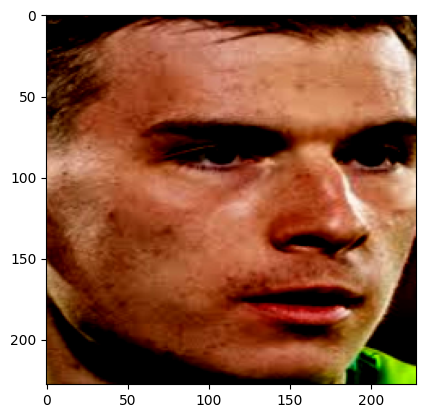

In [19]:
img_new = img_cropped.numpy()
img_new = np.stack((img_new[0], img_new[1], img_new[2]), axis=2)
plt.imshow(img_new)

In [20]:
def faceAndEmbedding(img_path):
    img = Image.open(img_path)

    # Get cropped and prewhitened image tensor
    img_cropped = mtcnn(img)
    img_new = img_cropped.numpy()
    img_new = np.stack((img_new[0], img_new[1], img_new[2]), axis=2)
    # Calculate embedding (unsqueeze to add batch dimension)
    img_embedding = resnet(img_cropped.unsqueeze(0)).detach().numpy()
    return img_new, img_embedding

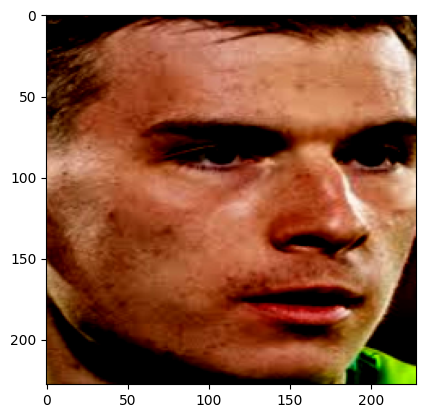

In [21]:
mulan1, mulan1_emb = faceAndEmbedding('/content/drive/MyDrive/dataset_realmadrid/andriy_lunin/8.jpg')
plt.imshow(mulan1)

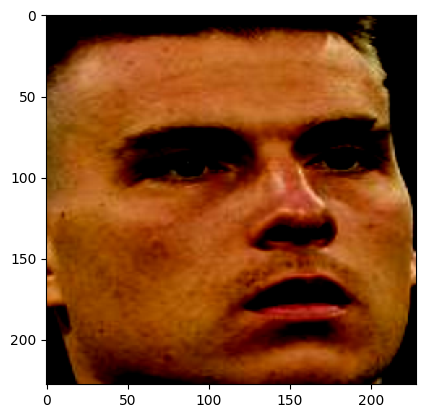

In [22]:
mulan2, mulan2_emb = faceAndEmbedding('/content/drive/MyDrive/dataset_realmadrid/andriy_lunin/7.jpg')
plt.imshow(mulan2)

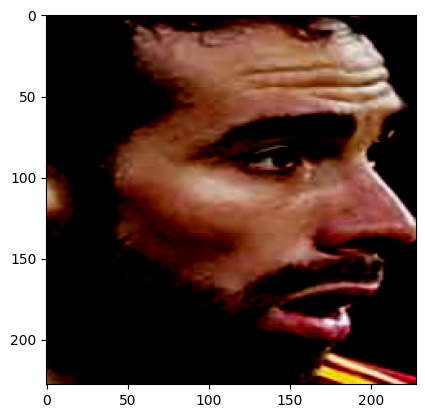

In [23]:
oh1, oh1_emb = faceAndEmbedding('/content/drive/MyDrive/dataset_realmadrid/dani_carvajal/1.jpg')
plt.imshow(oh1)

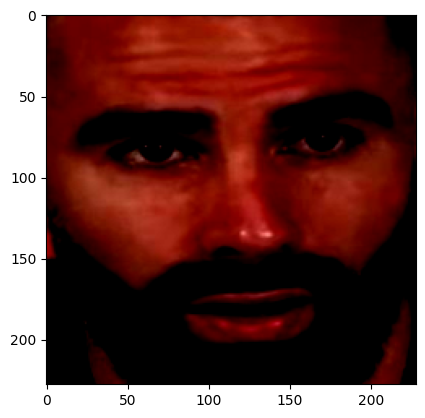

In [24]:
oh2, oh2_emb = faceAndEmbedding('/content/drive/MyDrive/dataset_realmadrid/dani_carvajal/8.jpg')
plt.imshow(oh2)

In [25]:
from scipy.spatial import distance

In [26]:
#Let test with the same image embedding to check if it is correct

In [27]:
distance.cosine([1,1,1], [1,1,1])

0

In [28]:
distance.cosine(oh1_emb[0], oh1_emb[0])

0

In [29]:
distance.cosine(oh1_emb[0], oh2_emb[0])

0.3924829959869385

In [30]:
distance.cosine(oh1_emb[0], mulan1_emb[0])

0.7929322421550751

In [31]:
distance.cosine(mulan1_emb[0], mulan2_emb[0])

0.12480098009109497

In [32]:
distance.cosine(oh1_emb[0], mulan2_emb[0])

0.9430836848914623

In [33]:
distance.cosine(oh2_emb[0], mulan2_emb[0])

0.9754762649536133

In [34]:
#to create the dataset (you need to collect your own data from the internet), at least 10 images for 3 classes, 30 img in total, it should be balanced
#to write Agglomerative clustering function to make clasters
#bonus points - to write the function from scretch with numpy (+ 1 point)
#to evaluate clastering with accuracy, show confusion model
#visualise error, suggestion why
# to visualize your claster (you can find your own way for data visualisation)

In [35]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from PIL import Image
from scipy.spatial.distance import pdist, squareform

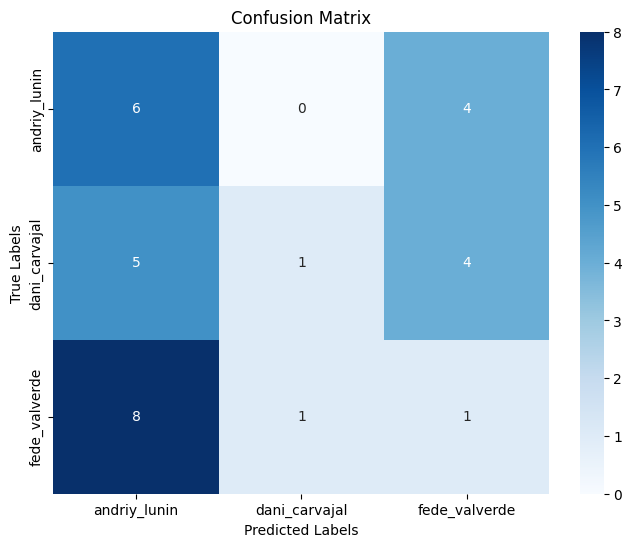

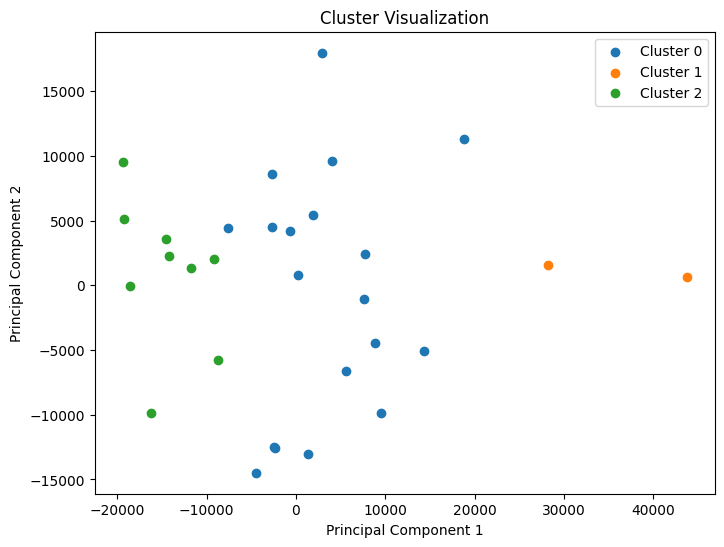

Accuracy: 0.26666666666666666


In [36]:
def load_dataset(folder_path, image_size):
    X = []
    y = []
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        images = load_images_from_folder(class_folder, image_size)
        X.extend(images)
        y.extend([class_name] * len(images))
    return np.array(X), np.array(y)

def load_images_from_folder(folder, image_size):
    images = []
    for filename in os.listdir(folder):
        img = Image.open(os.path.join(folder, filename))
        if img is not None:
            img = img.resize(image_size)
            images.append(np.array(img))
    return images

def agglomerative_clustering(X, n_clusters):
    clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(X)
    return clustering.labels_

def evaluate_clustering(true_labels, predicted_labels):
    accuracy = accuracy_score(true_labels, predicted_labels)
    confusion_mat = confusion_matrix(true_labels, predicted_labels)
    return accuracy, confusion_mat

def visualize_confusion_matrix(confusion_mat, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

def visualize_clusters(X_pca, labels, n_clusters):
    plt.figure(figsize=(8, 6))
    for i in range(n_clusters):
        plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], label=f'Cluster {i}')
    plt.legend()
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('Cluster Visualization')
    plt.show()
#
dataset_folder = "/content/drive/MyDrive/dataset_realmadrid"
n_clusters = 3
image_size = (200, 200)

X, y = load_dataset(dataset_folder, image_size)

X_flat = X.reshape(X.shape[0], -1)

cluster_labels = agglomerative_clustering(X_flat, n_clusters)

label_encoder = LabelEncoder()
true_labels_encoded = label_encoder.fit_transform(y)

accuracy, confusion_mat = evaluate_clustering(true_labels_encoded, cluster_labels)

labels = label_encoder.classes_
visualize_confusion_matrix(confusion_mat, labels)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_flat)

visualize_clusters(X_pca, cluster_labels, n_clusters)

print("Accuracy:", accuracy)

In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mtcn = MTCNN(image_size = 228, device = device)
resnet = InceptionResnetV1(pretrained='vggface2').eval()

In [38]:
def load_images_and_embeddings(folder):
  images = [];
  embeddings = []
  for file in os.listdir(folder):
    if file.endswith(".jpg"):
      img_path = os.path.join(folder, file)
      img = Image.open(img_path)

      img_cropped = mtcn(img)
      if img_cropped is not None:
        images.append(np.asarray(img_cropped))

        img_embeddings = resnet(img_cropped.unsqueeze(0)).detach().numpy()
        print(file)
        embeddings.append(img_embeddings)

  return images, embeddings

In [39]:
dc_images, dc_embed = load_images_and_embeddings('/content/drive/MyDrive/dataset_realmadrid/dani_carvajal')
al_images, al_embed = load_images_and_embeddings('/content/drive/MyDrive/dataset_realmadrid/andriy_lunin')
fv_images, fv_embed = load_images_and_embeddings('/content/drive/MyDrive/dataset_realmadrid/fede_valverde')

1.jpg
2.jpg
3.jpg
4.jpg
6.jpg
7.jpg
8.jpg
9.jpg
10.jpg
5.jpg
1.jpg
2.jpg
3.jpg
4.jpg
5.jpg
6.jpg
7.jpg
8.jpg
9.jpg
10.jpg
1.jpg
2.jpg
3.jpg
5.jpg
6.jpg
7.jpg
8.jpg
9.jpg
10.jpg
4.jpg


In [40]:
all_images = dc_images + al_images + fv_images
all_embeddings = dc_embed + al_embed + fv_embed
all_images = np.array(all_images)
all_embeddings = np.concatenate(all_embeddings)

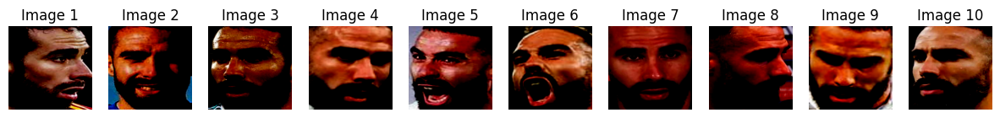

In [41]:
num_images = len(dc_images)
fig, ax = plt.subplots(1, num_images, figsize=(15, 5))
for i, image in enumerate(dc_images):
    ax[i].imshow(image.transpose(1, 2, 0))
    ax[i].axis('off')
    ax[i].set_title(f'Image {i+1}')

plt.show()

In [42]:
from scipy.spatial import distance

In [43]:
for i in range(1, 10):
  print(distance.cosine(dc_embed[0][0], dc_embed[i][0]))

0.38797515630722046
0.257995069026947
0.2592618465423584
0.4887368679046631
0.49684983491897583
0.3924829959869385
0.17938989400863647
0.3365491032600403
0.26753801107406616


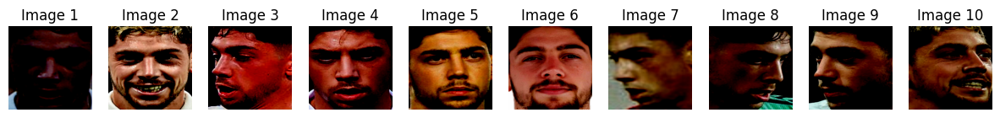

In [44]:
num_images = len(fv_images)
fig, ax = plt.subplots(1, num_images, figsize=(15, 5))
for i, image in enumerate(fv_images):
    ax[i].imshow(image.transpose(1, 2, 0))
    ax[i].axis('off')
    ax[i].set_title(f'Image {i+1}')

plt.show()

In [45]:
for i in range(1, 10):
  print(distance.cosine(fv_embed[0][0], fv_embed[i][0]))

0.2684859037399292
0.4003804922103882
0.2535925507545471
0.277060329914093
0.4837898015975952
0.5175711214542389
0.4423918128013611
0.34378480911254883
0.3090084195137024


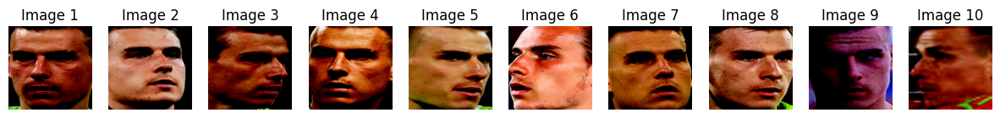

In [46]:
num_images = len(al_images)
fig, ax = plt.subplots(1, num_images, figsize=(15, 5))
for i, image in enumerate(al_images):
    ax[i].imshow(image.transpose(1, 2, 0))
    ax[i].axis('off')
    ax[i].set_title(f'Image {i+1}')

plt.show()

In [47]:
for i in range(1, 10):
  print(distance.cosine(al_embed[0][0], al_embed[i][0]))

0.27690404653549194
0.20212864875793457
0.10937899351119995
0.16590005159378052
0.3980403542518616
0.14215487241744995
0.2115122675895691
0.22186881303787231
0.42852193117141724


In [48]:
distance.cosine(dc_embed[4][0], fv_embed[3][0])

0.8758942931890488

In [49]:
distance.cosine(dc_embed[4][0], al_embed[2][0])

0.8898574635386467

In [50]:
distance.cosine(fv_embed[3][0], al_embed[2][0])

0.8419248312711716

In [51]:
from scipy.spatial.distance import pdist, squareform

In [52]:
def agglomerative_clustering(X, n_clusters):
    distances = pdist(X)
    distance_matrix = squareform(distances)
    clusters = np.arange(len(X))

    for _ in range(len(X) - n_clusters):
        identity_matrix = np.eye(len(distance_matrix))
        np.fill_diagonal(identity_matrix, np.inf)

        i, j = np.unravel_index(np.argmin(distance_matrix + identity_matrix), distance_matrix.shape)
        clusters[clusters == clusters[j]] = clusters[i]
        distance_matrix[i, :] = np.maximum(distance_matrix[i, :], distance_matrix[j, :])
        distance_matrix[:, i] = np.maximum(distance_matrix[:, i], distance_matrix[:, j])
        distance_matrix[i, i] = np.inf
        distance_matrix = np.delete(distance_matrix, j, axis=0)
        distance_matrix = np.delete(distance_matrix, j, axis=1)

    return clusters

In [53]:
print(all_images[0].shape)
print(np.array(all_embeddings).shape)

(3, 228, 228)
(30, 512)


[2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 1 1]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


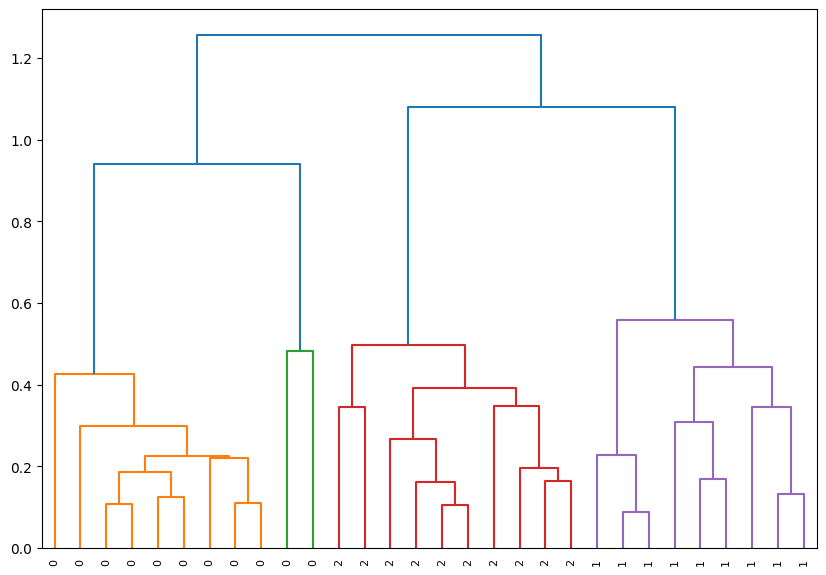

In [54]:
def agglomerative_clustering(embeddings, n_clusters):
    embeddings_flat = np.array(embeddings).reshape(len(embeddings), -1)
    clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='complete', affinity='cosine')
    clustering.fit(embeddings_flat)

    return clustering.labels_, clustering.children_, embeddings_flat

def visualize_dendrogram(labels, children, embeddings_flat):
    from scipy.cluster.hierarchy import dendrogram, linkage
    linkage_matrix = linkage(embeddings_flat, 'complete', 'cosine')
    plt.figure(figsize=(10, 7))
    dendrogram(linkage_matrix, labels=labels, leaf_rotation=90., leaf_font_size=8.)
    plt.show()

n_clusters = 3
labels, children, embeddings_flat = agglomerative_clustering(all_embeddings, n_clusters)
# visualize_clusters(all_images, labels, n_clusters)
print(labels)
visualize_dendrogram(labels, children, embeddings_flat)

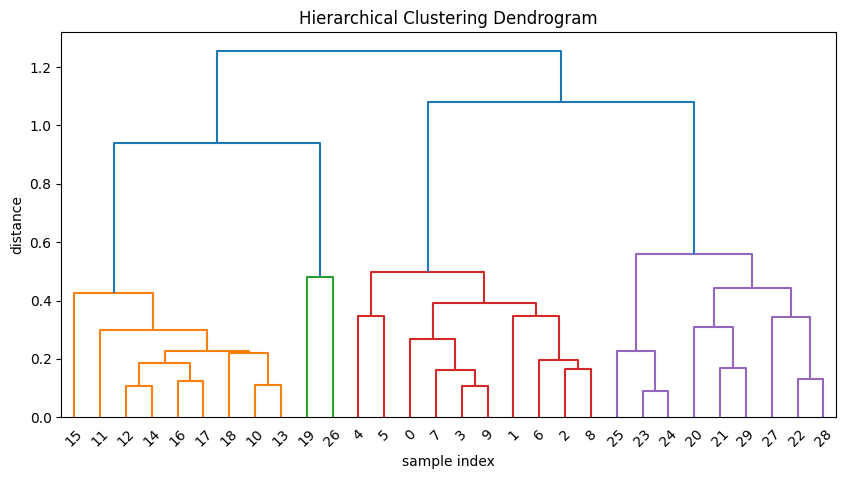

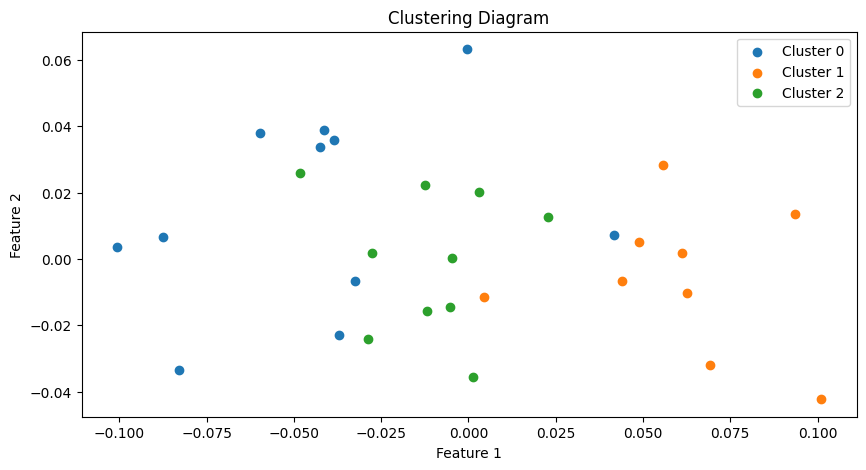

In [55]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy

def plot_dendrogram(embeddings):
    distances = hierarchy.distance.pdist(embeddings, metric='cosine')
    linkage_matrix = hierarchy.linkage(distances, method='complete')
    plt.figure(figsize=(10, 5))
    dendrogram(linkage_matrix)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('sample index')
    plt.ylabel('distance')
    plt.show()

def plot_clustering(embeddings, labels, n_clusters):
    plt.figure(figsize=(10, 5))
    for i in range(n_clusters):
        cluster_embeddings = embeddings[labels == i]
        plt.scatter(cluster_embeddings[:, 0], cluster_embeddings[:, 1], label=f'Cluster {i}')
    plt.title('Clustering Diagram')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()


plot_dendrogram(all_embeddings)
plot_clustering(all_embeddings, labels, n_clusters)


In [56]:
import numpy as np

def agglomerative_clustering(embeddings, n_clusters):
    clusters = [[i] for i in range(len(embeddings))]
    distances = np.zeros((len(clusters), len(clusters)))
    for i in range(len(clusters)):
        for j in range(i+1, len(clusters)):
            distances[i, j] = distances[j, i] = np.linalg.norm(embeddings[clusters[i][0]] - embeddings[clusters[j][0]])

    while len(clusters) > n_clusters:
        i, j = np.unravel_index(np.argmin(distances, axis=None), distances.shape)

        clusters[i] += clusters[j]
        del clusters[j]

        distances = np.delete(distances, j, axis=0)
        distances = np.delete(distances, j, axis=1)
        for k in range(len(clusters)):
            if k != i:
                distances[i, k] = distances[k, i] = np.linalg.norm(embeddings[clusters[i][0]] - embeddings[clusters[k][0]])

    return clusters
n_clusters = 3
clusters = agglomerative_clustering(all_embeddings, n_clusters)

In [57]:
from sklearn.cluster import AgglomerativeClustering

clustering = AgglomerativeClustering(n_clusters=3).fit(all_embeddings)
predicted_labels = clustering.labels_

def evaluate_clustering(true_labels, predicted_labels):
    accuracy = accuracy_score(true_labels, predicted_labels)
    confusion = confusion_matrix(true_labels, predicted_labels)
    print("Accuracy:", accuracy)
    print("Confusion Matrix:\n", confusion)

true_labels = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

evaluate_clustering(true_labels, predicted_labels)
print(predicted_labels)

Accuracy: 0.3
Confusion Matrix:
 [[ 0 10  0]
 [10  0  0]
 [ 1  0  9]]
[1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 0 2 2 2]


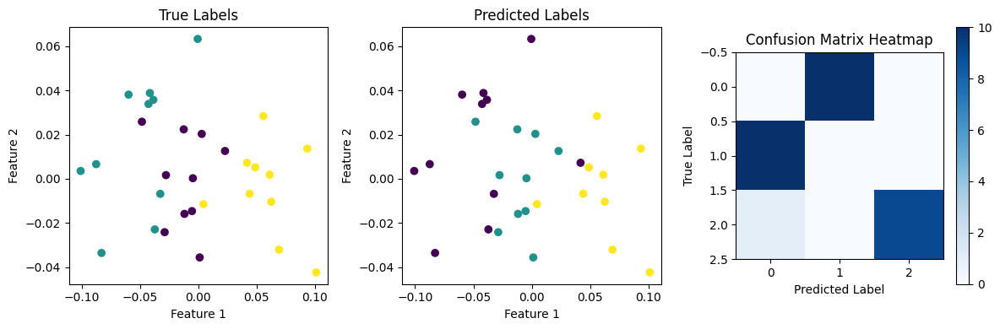

In [58]:
def visualize_errors(all_embeddings, true_labels, predicted_labels):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.scatter(all_embeddings[:, 0], all_embeddings[:, 1], c=true_labels, cmap='viridis')
    plt.title('True Labels')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

    plt.subplot(1, 3, 2)
    plt.scatter(all_embeddings[:, 0], all_embeddings[:, 1], c=predicted_labels, cmap='viridis')
    plt.title('Predicted Labels')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

    confusion = confusion_matrix(true_labels, predicted_labels)
    plt.subplot(1, 3, 3)
    plt.imshow(confusion, cmap='Blues', interpolation='nearest')
    plt.colorbar()
    plt.title('Confusion Matrix Heatmap')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.tight_layout()
    plt.show()

visualize_errors(all_embeddings, true_labels, predicted_labels)

True Label: 0
Predicted Label: 1


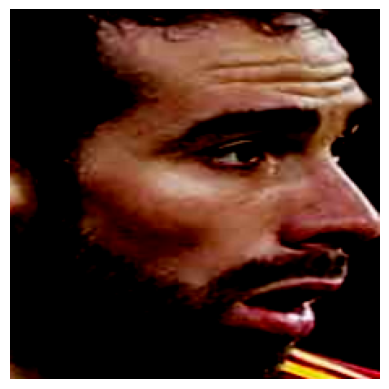

True Label: 0
Predicted Label: 1


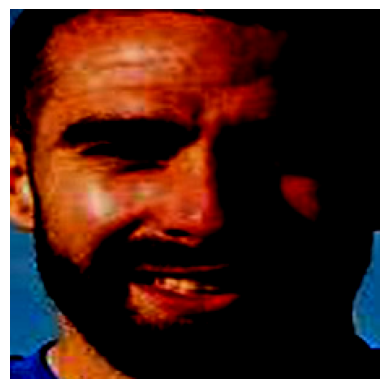

True Label: 0
Predicted Label: 1


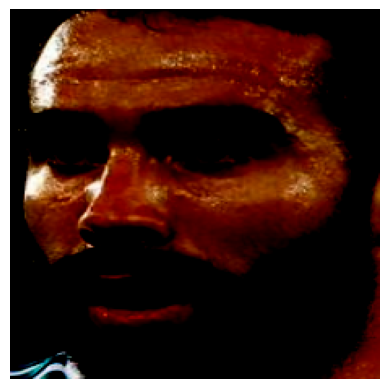

True Label: 0
Predicted Label: 1


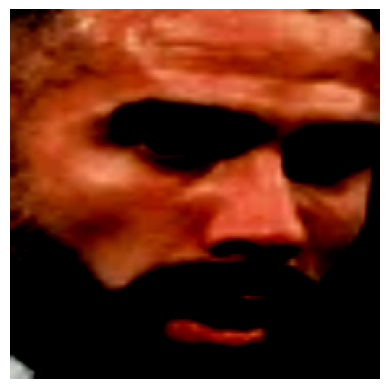

True Label: 0
Predicted Label: 1


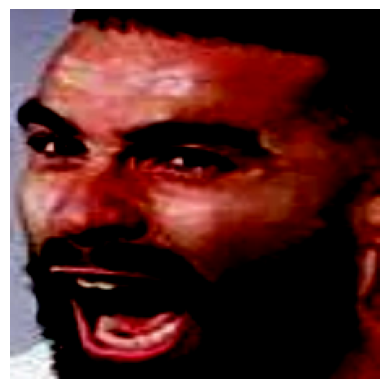

True Label: 0
Predicted Label: 1


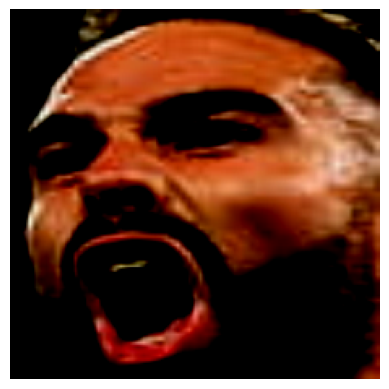

True Label: 0
Predicted Label: 1


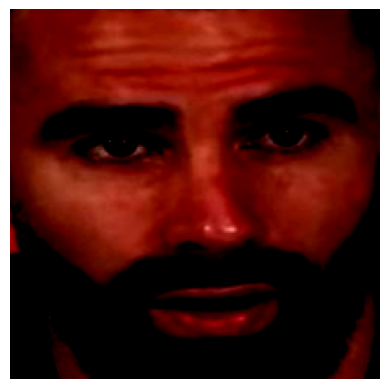

True Label: 0
Predicted Label: 1


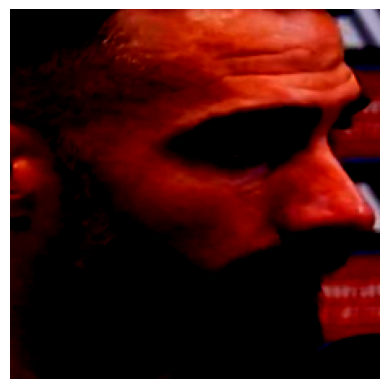

True Label: 0
Predicted Label: 1


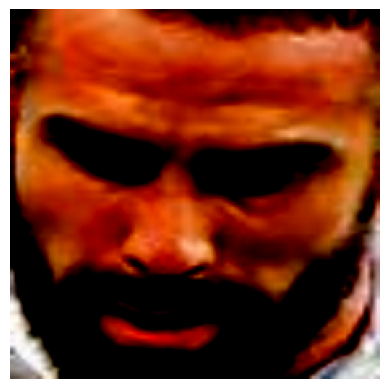

True Label: 0
Predicted Label: 1


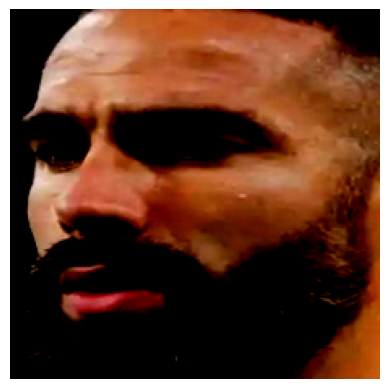

True Label: 1
Predicted Label: 0


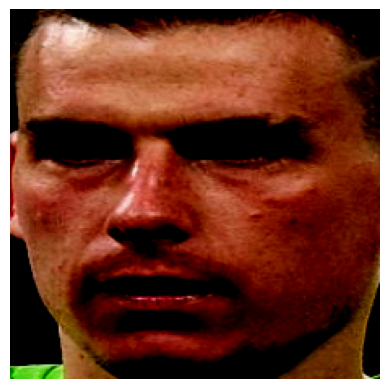

True Label: 1
Predicted Label: 0


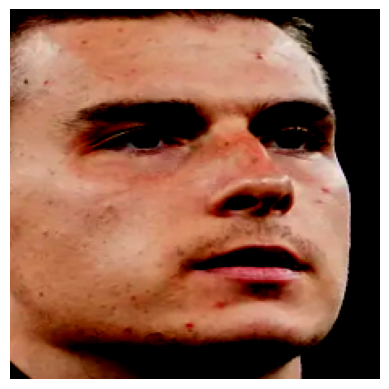

True Label: 1
Predicted Label: 0


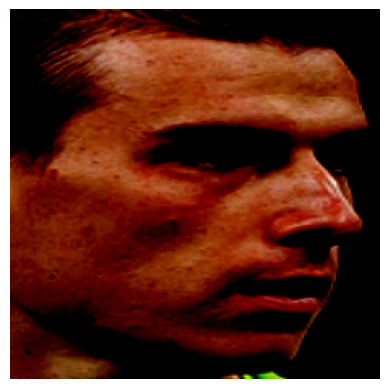

True Label: 1
Predicted Label: 0


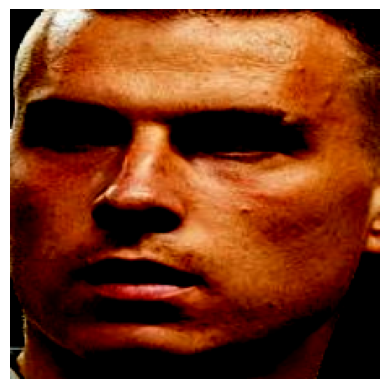

True Label: 1
Predicted Label: 0


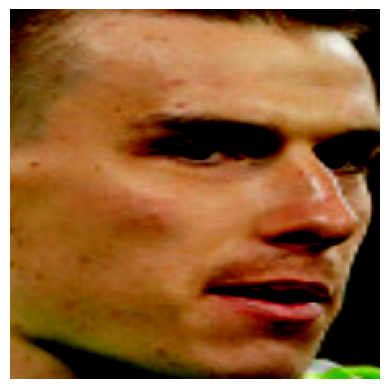

True Label: 1
Predicted Label: 0


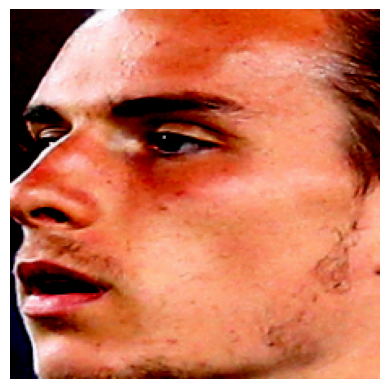

True Label: 1
Predicted Label: 0


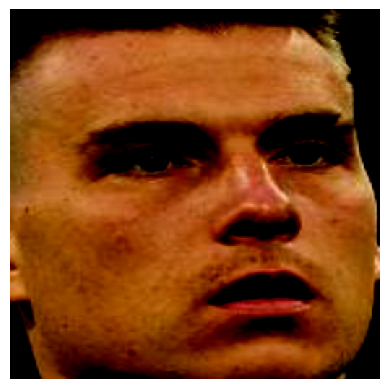

True Label: 1
Predicted Label: 0


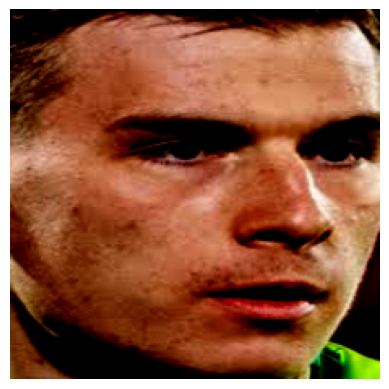

True Label: 1
Predicted Label: 0


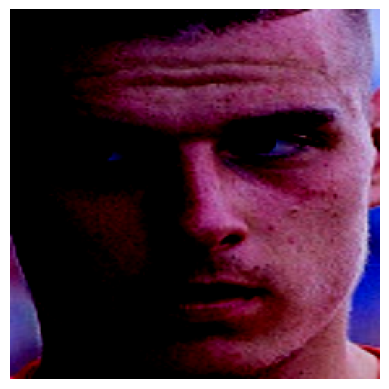

True Label: 1
Predicted Label: 0


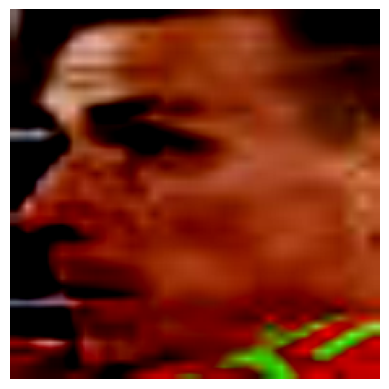

True Label: 2
Predicted Label: 0


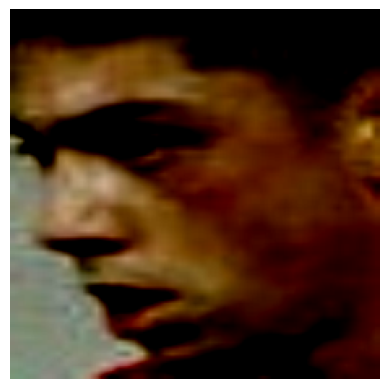

In [59]:
misclassified_images = {}

for i, (image_data, true_label) in enumerate(zip(all_images, true_labels)):
    if predicted_labels[i] != true_label:
        misclassified_images[i] = {"image_data": image_data, "true_label": true_label, "predicted_label": predicted_labels[i]}
for _, info in misclassified_images.items():
    print("True Label:", info["true_label"])
    print("Predicted Label:", info["predicted_label"])

    # Retrieve the image data directly from the dictionary
    image_data = info["image_data"]

    # Transpose the image data if needed
    if len(image_data.shape) == 3 and image_data.shape[0] == 3:
        image_data = np.transpose(image_data, (1, 2, 0))  # Assuming image_data is in the format (channels, height, width)

    # Display the image
    plt.imshow(image_data, cmap='gray')
    plt.axis('off')
    plt.show()


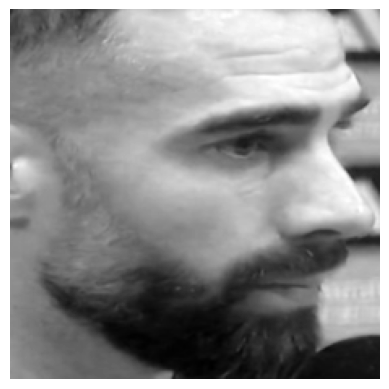

0.840597540140152
0.7559947222471237
0.6671169400215149
0.7582660764455795
0.6050675511360168
0.6628779172897339
0.7524547576904297
0.6967639327049255
0.8020718693733215
0.6155727505683899


In [60]:
image_data = dc_images[7][0]

if len(image_data.shape) == 3 and image_data.shape[0] == 3:
    image_data = np.transpose(image_data, (1, 2, 0))

plt.imshow(image_data, cmap='gray')
plt.axis('off')
plt.show()

for i in range(0, 10):
    print(distance.cosine(dc_embed[7][0], al_embed[i][0]))

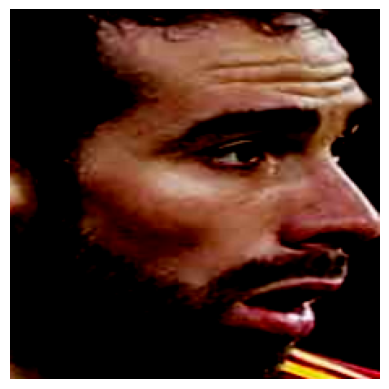

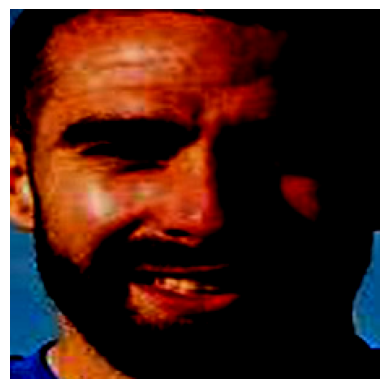

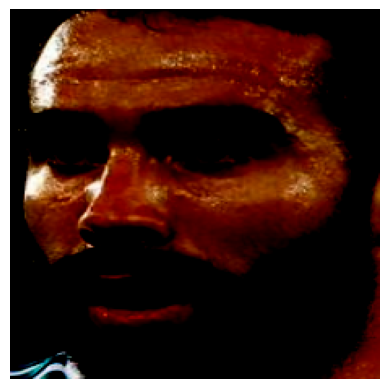

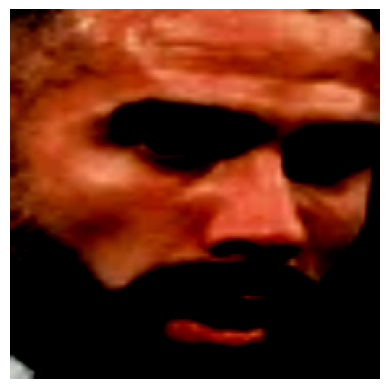

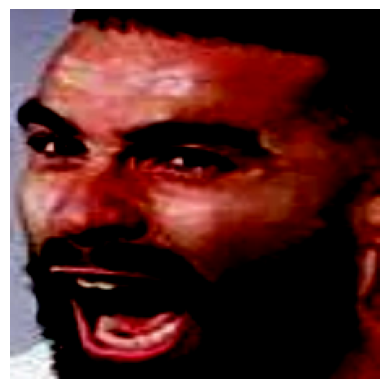

...

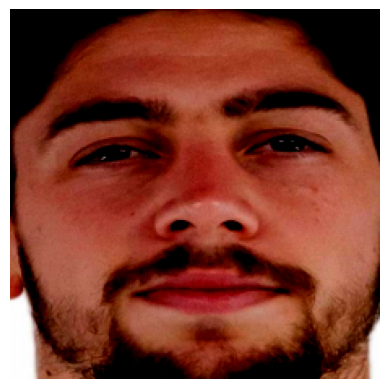

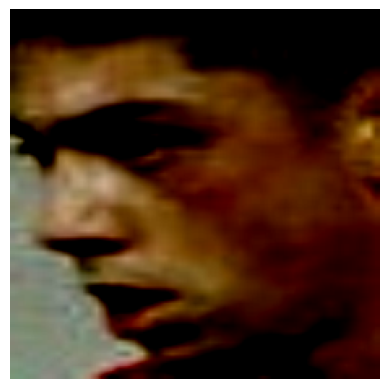

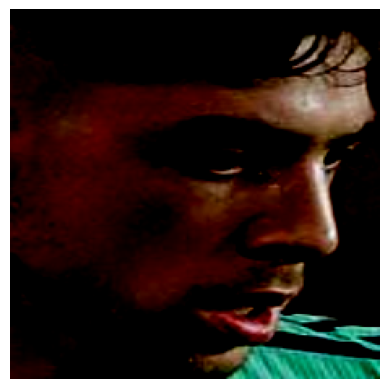

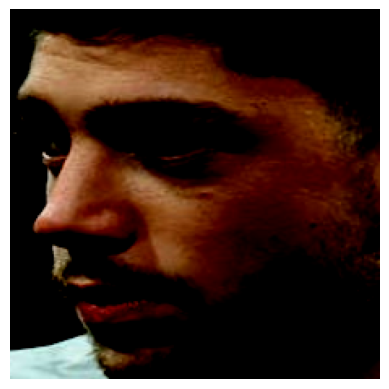

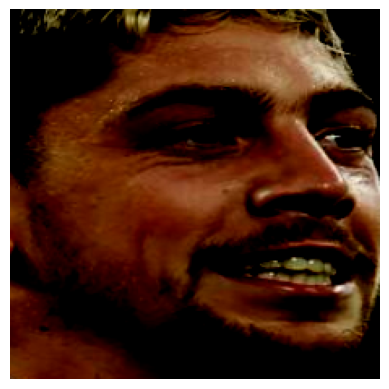

In [61]:
for image_data in all_images:
    if len(image_data.shape) == 3 and image_data.shape[0] == 3:
        image_data = np.transpose(image_data, (1, 2, 0))

    plt.imshow(image_data, cmap='gray')
    plt.axis('off')
    plt.show()

In [62]:
clusters = [[] for _ in range(n_clusters)]
for i, label in enumerate(labels):
    clusters[label].append(i)

In [63]:
from sklearn.datasets import make_blobs

clustering = AgglomerativeClustering(n_clusters=3).fit(X)
predicted_labels = clustering.labels_

accuracy = accuracy_score(y, predicted_labels)
confusion = confusion_matrix(y, predicted_labels)

print("Accuracy:", accuracy)
print("Confusion Matrix:\n", confusion)

# Visualize errors
plt.figure(figsize=(12, 4))

# Plot true labels
plt.subplot(1, 3, 1)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
plt.title('True Labels')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

# Plot predicted labels
plt.subplot(1, 3, 2)
plt.scatter(X[:, 0], X[:, 1], c=predicted_labels, cmap='viridis')
plt.title('Predicted Labels')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

# Plot confusion matrix heatmap
plt.subplot(1, 3, 3)
plt.imshow(confusion, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.tight_layout()
plt.show()

ValueError: Found array with dim 4. AgglomerativeClustering expected <= 2.